Let's create a function to find out the country by IP.

In [64]:
import requests
def get_country(ip_address):
    # URL to send a request to the GeoIP API
    url = f"http://ip-api.com/json/{ip_address}"

    try:
        # Sending a GET request to the GeoIP API
        response = requests.get(url)
        df = response.json()

        # Extracting country and city information from a response
        country = df['country']
        

        return country

    except Exception as e:
        print("Error:", e)
        return None, None

# Example of using a function for an IP address
ip_address = "68.177.136.155"
country = get_country(ip_address)
print("Country:", country)

Country: United States


In [65]:
data['ip_country'] = data['ip_address'].apply(get_country)

Error: 'country'
Error: 'country'
Error: 'country'
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: 'country'
Error: 'country'
Error: 'country'
Error: 'country'
Error: 'country'
Error: 'country'
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: 'country'
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 

In [66]:
data['ip_country'].value_counts()

United States          57378
China                  14051
Japan                   7571
United Kingdom          6495
Germany                 5475
                       ...  
Cabo Verde                 1
Solomon Islands            1
Haiti                      1
Trinidad and Tobago        1
Bhutan                     1
Name: ip_country, Length: 154, dtype: int64

In [140]:
data['ip_country'].isnull().sum()

0

Great, we found the country by IP

In [68]:
data[data['fraud']==True]['ip_country'].value_counts() # Distribution of fraudulent transactions by country

United States                       3148
China                                760
Japan                                403
United Kingdom                       347
Germany                              313
                                    ... 
Democratic Republic of the Congo       1
Sri Lanka                              1
Oman                                   1
Palestinian Territory                  1
Senegal                                1
Name: ip_country, Length: 126, dtype: int64

In [67]:
ip_countries_list = list(data['ip_country'].unique()) #Let's look at the list of countries that we received from ip
print(ip_countries_list)

['Ivory Coast', 'China', 'United States', 'Japan', 'Australia', 'Italy', 'Belgium', 'Spain', 'Germany', 'United Kingdom', 'India', 'Brazil', 'Hong Kong', 'The Netherlands', 'Portugal', 'Canada', 'France', (None, None), 'Belarus', 'Russia', 'Mexico', 'Bulgaria', 'South Africa', 'Vietnam', 'Hungary', 'Benin', 'Poland', 'South Korea', 'Venezuela', 'Ireland', 'Argentina', 'Switzerland', 'Colombia', 'Sweden', 'Sudan', 'United Arab Emirates', 'Moldova', 'Zambia', 'Zimbabwe', 'Morocco', 'Czechia', 'Finland', 'Iran', 'Singapore', 'Denmark', 'Egypt', 'Ukraine', 'Philippines', 'Saudi Arabia', 'Taiwan', 'Nigeria', 'Chile', 'Kenya', 'Palestine', 'New Zealand', 'Kuwait', 'Belize', 'Norway', 'Algeria', 'Romania', 'Tunisia', 'Türkiye', 'Pakistan', 'Georgia', 'Thailand', 'Malaysia', 'Seychelles', 'Indonesia', 'Mauritius', 'Ecuador', 'Tanzania', 'Puerto Rico', 'Austria', 'Uganda', 'Greece', 'Estonia', 'Serbia', 'Slovakia', 'Malawi', 'Peru', 'Slovenia', 'Israel', 'Nepal', 'Netherlands', 'Mozambique', 'D

In [80]:
# Create a DataFrame with data for each unique country and output transactions where fraud == True
fraud_transactions = data[data['fraud'] == True].groupby('ip_country').size().reset_index(name='fraud_count')

# Create a DataFrame with data for each unique country and the total number of transactions
total_transactions = data.groupby('ip_country').size().reset_index(name='total_count')

# Join both DataFrames by column 'ip_country'
result_df = pd.merge(fraud_transactions, total_transactions, on='ip_country', how='outer')

# Fill in missing values ​​with zeros (if there were no fraudulent transactions for some countries)
result_df.fillna(0, inplace=True)

result_df.sort_values(by='fraud_count', ascending=False, inplace=True)
result_df.head(10)

,ip_country,fraud_count,total_count
121,United States,3148.0,57378
22,China,760.0,14051
56,Japan,403.0,7571
120,United Kingdom,347.0,6495
37,Germany,313.0,5475
100,South Korea,210.0,3802
34,France,207.0,3449
0,"(None, None)",202.0,3735
15,Brazil,190.0,3601
53,Italy,142.0,2767


In [85]:
def get_region(ip_address):
    # URL to send a request to the GeoIP API
    url = f"http://ip-api.com/json/{ip_address}"

    try:
        # Sending a GET request to the GeoIP API
        response = requests.get(url)
        data = response.json()

        # Extracting state/region information from a response
        region = data.get('regionName', None)  # 'regionName' may contain state or region

        return region

    except Exception as e:
        print("Error:", e)
        return None

# Example of using a function for an IP address
ip_address = "68.177.136.155"
region = get_region(ip_address)
print("state (region):", region)

state (region): Florida


In [86]:
data['ip_state'] = data['ip_address'].apply(get_region)

Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting value: line 1 column 1 (char 0)
Error: Expecting val

In [87]:
data['ip_state'].value_counts()

Ohio                2963
California          1759
England             1739
New York            1262
Tokyo               1204
                    ... 
Manisa                 1
Leningrad Oblast       1
Sulaymaniyah           1
Puebla                 1
Kerala                 1
Name: ip_state, Length: 820, dtype: int64

In [138]:
data['ip_state'].isnull().sum()

106285

There were problems with obtaining the region, there were too many gaps, in this form this sign will not be useful to us.

In [89]:
ip_state_list = list(data['ip_state'].unique())
print(ip_state_list)

['Abidjan', 'Guangdong', 'Pennsylvania', 'New Jersey', 'Kanagawa', 'Illinois', 'Ohio', 'Queensland', 'Piedmont', 'Tokyo', 'Lombardy', 'Fujian', 'Hawaii', 'Flanders', 'Canary Islands', 'Arizona', 'Massachusetts', 'North Rhine-Westphalia', 'Alaska', 'Virginia', 'England', 'Bihar', 'Parana', 'Shaanxi', 'Central and Western District', 'Beijing', 'Shanghai', 'Campania', 'Hyōgo', 'North Holland', 'Lisbon', 'New York', 'California', 'Ontario', 'South Carolina', 'Ibaraki', 'Hesse', 'Brittany', 'Lazio', 'Washington', 'Aichi', 'Florida', None, 'Centre-Val de Loire', 'Minsk City', 'North Carolina', 'District of Columbia', 'St.-Petersburg', 'Georgia', 'Anhui', 'Colorado', 'Baja California', 'Sofia-Capital', 'Gauteng', 'Sao Paulo', 'Alabama', 'Bắc Ninh Province', 'Minnesota', 'Littoral', 'Hanoi', 'Limburg', 'Louisiana', 'Leinster', 'Oregon', 'Qinghai', 'Lower Saxony', 'Buenos Aires', 'Goias', 'Santa Fe', 'Stockholm County', 'New South Wales', 'Occitanie', 'Texas', 'Galicia', 'Gyeongsangbuk-do', 'Si

__So, great, we have the billing_country attribute that contains data from the country of card registration (USA) and data from the country where the transaction was carried out, ip_country. We will make additional indications whether the country and state of registration matches the country and state of the transaction__

The country of registration is not clearly indicated, but let's check whether the cards are registered in the states or not.

In [95]:
states = [
    "Alabama", "Alaska", "Arizona", "Arkansas", "California", "Colorado", "Connecticut", "Delaware", "Florida",
    "Georgia", "Hawaii", "Idaho", "Illinois", "Indiana", "Iowa", "Kansas", "Kentucky", "Louisiana", "Maine",
    "Maryland", "Massachusetts", "Michigan", "Minnesota", "Mississippi", "Missouri", "Montana", "Nebraska",
    "Nevada", "New Hampshire", "New Jersey", "New Mexico", "New York", "North Carolina", "North Dakota", "Ohio",
    "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas",
    "Utah", "Vermont", "Virginia", "Washington", "West Virginia", "Wisconsin", "Wyoming"
]

data['billing_country'] = data['billing_state'].apply(lambda x: 'United States' if x in states else None)
data['billing_country'].value_counts()


United States    147123
Name: billing_country, dtype: int64

All transactions with billing addresses from the USA

In [142]:
data['country_match'] = data.apply(lambda row: 0 if row['billing_country'] == row['ip_country'] else 1, axis=1)
print(data['country_match'].value_counts()) #Discrepancies by country (1 does not match)

1    89745
0    57378
Name: country_match, dtype: int64


We will transfer those addresses that have already been scammed to the list to give weight and mark those who are scammers

In [98]:
black_list = data[data['fraud'] == True]['ip_address'].unique().tolist()
print('IP addresses from which there were fraudulent transactions', black_list)
print('lenth of black list', len(black_list))

IP addresses from which there were fraudulent transactions ['192.167.7.42', '110.81.226.130', '93.204.224.31', '96.100.129.207', '179.105.147.32', '148.92.230.219', '211.69.245.145', '26.80.84.59', '96.31.180.211', '143.15.243.175', '193.88.88.39', '140.52.241.167', '27.126.49.10', '159.110.253.5', '37.242.38.37', '22.129.224.214', '40.90.96.113', '118.37.219.182', '51.239.6.85', '148.178.40.84', '220.136.33.1', '67.58.19.50', '45.140.226.174', '52.63.210.87', '65.161.47.78', '183.33.79.188', '36.55.154.85', '64.221.56.85', '52.227.226.208', '153.180.139.1', '221.107.175.65', '88.122.168.62', '55.75.197.38', '54.11.135.65', '83.3.91.183', '23.93.243.124', '148.44.122.27', '62.49.193.64', '80.32.206.234', '47.102.83.63', '145.212.60.183', '99.145.193.142', '140.166.187.13', '204.24.138.62', '213.169.204.55', '167.242.121.168', '47.33.172.61', '84.112.92.70', '62.240.183.21', '146.158.100.46', '196.53.241.72', '68.110.173.67', '110.39.218.175', '88.9.170.217', '91.107.15.135', '181.130.1

In [107]:
# let's make a dictionary from the ip from which the fraudulent transaction occurred
black_list_ip = data[data['fraud']==True]['ip_address'].value_counts(ascending=False).to_dict()
# Create a new black_list attribute
data['black_list'] = data['ip_address'].map(lambda x: 2 if x in black_list_ip and black_list_ip[x] > 1 else (1 if x in black_list_ip and black_list_ip[x] == 1 else 0))


In [168]:
data['browser'] = 'other'

# Condition for searching for occurrences of words
data.loc[data['user_agent'].str.contains('Opera'), 'browser'] = 1
data.loc[data['user_agent'].str.contains('Mozilla'), 'browser'] = 0

data.head()

,account_age_days,transaction_amt,transaction_adj_amt,historic_velocity,ip_address,user_agent,email_domain,phone_number,billing_city,billing_postal,...,hour,day_of_week,ip_country,ip_state,billing_country_USA,billing_country,country_match,black_list,browser,locale_country
0,3371.0,2167.0,56.0,2572.0,154.68.49.124,Opera/9.81.(Windows NT 10.0; ht-HT) Presto/2.9...,perez-garza.com,878-111-5140,Woodsburgh,96336.0,...,9,1,Ivory Coast,Abidjan,1,United States,1,0,1,New Zealand
1,2714.0,2045.0,48.0,4517.0,39.131.125.85,Opera/9.76.(X11; Linux i686; mi-NZ) Presto/2.9...,mcneil-ortega.com,(002)736-0139,West Kevin,78083.0,...,18,1,China,Guangdong,1,United States,1,1,1,India
2,6987.0,2892.0,61.0,5007.0,166.245.194.83,Mozilla/5.0 (X11; Linux x86_64; rv:1.9.6.20) G...,davis-calderon.com,(983)585-2863x652,Lorichester,83236.0,...,13,0,United States,Pennsylvania,1,United States,0,0,0,Maldives
3,2712.0,3040.0,28.0,6022.0,100.1.217.216,Mozilla/5.0 (Macintosh; Intel Mac OS X 10 9_3 ...,rose-lee.org,+1-678-897-3420x60738,Stephenmouth,78364.0,...,7,3,United States,New Jersey,1,United States,0,0,0,Eritrea
4,3598.0,2976.0,66.0,2600.0,113.156.65.245,Mozilla/5.0 (X11; Linux x86_64; rv:1.9.5.20) G...,nash.net,(013)204-1766x92641,New Brianmouth,77499.0,...,6,5,Japan,Kanagawa,1,United States,1,0,0,Nepal


Let's pay attention to the locale attribute. It contains the country and language region code for the transaction. Let's try to create a new attribute with the transaction country.

In [145]:
# We found the two-letter designation of countries from external sources and compiled the list
country_codes_short = ['NZ', 'IN', 'MV', 'ER', 'NP', 'PE', 'CA', 'SE', 'TW', 'IN', 'IN', 'UZ', 'IN', 'PL', 'NL', 'IN', 'RU', 'BE', 'IT', 'NU', 'KE', 'ZA', 'AF', 'TW', 'ID', 'NG', 'CZ', 'NO', 'IN', 'ZA', 'MX', 'BA', 'ZA', 'LK', 'FO', 'PL', 'AZ', 'IN', 'US', 'UG', 'SN', 'DK', 'MG', 'ER', 'GB', 'AM', 'IE', 'MM', 'SK', 'IR', 'CD', 'DJ', 'MA', 'AW', 'IN', 'NZ', 'MY', 'IN', 'IN', 'KZ', 'GB', 'MN', 'GR', 'HU', 'IN', 'ZA', 'FR', 'BD', 'US', 'BE', 'SV', 'ZA', 'PH', 'IN', 'IN', 'RU', 'KG', 'PH', 'ZA', 'ET', 'ET', 'JP', 'UA', 'IN', 'AN', 'UA', 'TW', 'TJ', 'VN', 'ET', 'GB', 'ES', 'BG', 'KH', 'IT', 'ES', 'CA', 'ET', 'KE', 'FR', 'ES', 'LV', 'IN', 'FR', 'IN', 'GB', 'RW', 'LK', 'ZM', 'KE', 'ES', 'IS', 'IN', 'IN', 'GL', 'LT', 'TR', 'IT', 'CR', 'UA', 'CH', 'EE', 'GH', 'ET', 'IN', 'TR', 'DJ', 'IN', 'RO', 'MK', 'CA', 'RU', 'TW', 'CN', 'UY', 'RU', 'RU', 'PK', 'IN', 'ZA', 'PL', 'BY', 'HT', 'IN', 'PK', 'BE', 'EG', 'GE', 'FI', 'NO', 'SG', 'TZ', 'US', 'NP', 'FR', 'CN', 'ET', 'LU', 'IN', 'MT', 'HK', 'SI', 'IN', 'ER', 'NG', 'ZA', 'IN', 'TM', 'AT', 'FR', 'FI', 'DZ', 'IN', 'IN', 'PK', 'HR', 'NG', 'AL', 'IL', 'NG', 'RU', 'PE', 'HK', 'CW', 'MR', 'KR', 'ZA', 'IN', 'ZA', 'DE', 'US', 'IQ', 'AG', 'SN', 'LU', 'ET', 'DE', 'NL', 'NO', 'ZW', 'ML', 'IN', 'AD', 'CA', 'HK', 'BT', 'ME', 'PT', 'CY', 'ER', 'LA', 'MX', 'CH', 'LU', 'PS', 'RS', 'IQ', 'SO', 'OM', 'EC', 'BE', 'DE', 'US', 'ES', 'CY', 'IL', 'CA', 'DO', 'LI', 'PR', 'IT', 'BO', 'SG', 'PY', 'DJ', 'GB', 'AU', 'HN', 'AE', 'IE', 'SO', 'SS', 'TN', 'SD', 'AR', 'PE', 'YE', 'GT', 'PH', 'DK', 'ZA', 'SY', 'NZ', 'ES', 'AR', 'DZ', 'VE', 'CO', 'CL', 'JO', 'KW', 'TD', 'MA', 'BW', 'SA', 'LB', 'LY', 'EH']

For convenience, we will make a dictionary where the country is the key and its two-letter designation is the value.

In [148]:
import pycountry

# Create an empty dictionary to store data
country_dict = {}

# Iterate through each country designation from the list
for code in country_codes_short:
    # We are trying to get a country object by designation
    try:
        country = pycountry.countries.get(alpha_2=code)
        # If the object is found, add it to the dictionary: key - country name, value - designation
        if country:
            country_dict[country.name] = code
    except LookupError:
        pass

# Output the resulting dictionary
print(country_dict)

{'New Zealand': 'NZ', 'India': 'IN', 'Maldives': 'MV', 'Eritrea': 'ER', 'Nepal': 'NP', 'Peru': 'PE', 'Canada': 'CA', 'Sweden': 'SE', 'Taiwan, Province of China': 'TW', 'Uzbekistan': 'UZ', 'Poland': 'PL', 'Netherlands': 'NL', 'Russian Federation': 'RU', 'Belgium': 'BE', 'Italy': 'IT', 'Niue': 'NU', 'Kenya': 'KE', 'South Africa': 'ZA', 'Afghanistan': 'AF', 'Indonesia': 'ID', 'Nigeria': 'NG', 'Czechia': 'CZ', 'Norway': 'NO', 'Mexico': 'MX', 'Bosnia and Herzegovina': 'BA', 'Sri Lanka': 'LK', 'Faroe Islands': 'FO', 'Azerbaijan': 'AZ', 'United States': 'US', 'Uganda': 'UG', 'Senegal': 'SN', 'Denmark': 'DK', 'Madagascar': 'MG', 'United Kingdom': 'GB', 'Armenia': 'AM', 'Ireland': 'IE', 'Myanmar': 'MM', 'Slovakia': 'SK', 'Iran, Islamic Republic of': 'IR', 'Congo, The Democratic Republic of the': 'CD', 'Djibouti': 'DJ', 'Morocco': 'MA', 'Aruba': 'AW', 'Malaysia': 'MY', 'Kazakhstan': 'KZ', 'Mongolia': 'MN', 'Greece': 'GR', 'Hungary': 'HU', 'France': 'FR', 'Bangladesh': 'BD', 'El Salvador': 'SV', 

Now let’s apply the function and get a new attribute locale_country with the country from the locale attribute

In [155]:
data['locale_country'] = data['locale'].str.split('_').str[1]
reverse_country_dict = {v: k for k, v in country_dict.items()}
data['locale_country'] = data['locale_country'].map(reverse_country_dict)
data['locale_country'].value_counts()

India                        21582
South Africa                  8217
Russian Federation            4424
Ethiopia                      4103
Taiwan, Province of China     3389
                             ...  
Tunisia                         25
Western Sahara                  25
Sudan                           24
Oman                            22
Lebanon                         20
Name: locale_country, Length: 139, dtype: int64

### 4. Coding and Feature Selection

Let's look at the number of unique values in the features. We need this to determine the type of feature coding.

In [170]:
# Number of unique values analysis
for col in data.columns:
    display(f'Number of unique attribute values - {col}: {data[col].nunique()}')

'Number of unique attribute values - account_age_days: 6465'

'Number of unique attribute values - transaction_amt: 3687'

'Number of unique attribute values - transaction_adj_amt: 92'

'Number of unique attribute values - historic_velocity: 6745'

'Number of unique attribute values - ip_address: 13635'

'Number of unique attribute values - user_agent: 8796'

'Number of unique attribute values - email_domain: 7125'

'Number of unique attribute values - phone_number: 12170'

'Number of unique attribute values - billing_city: 9169'

'Number of unique attribute values - billing_postal: 11299'

'Number of unique attribute values - billing_state: 50'

'Number of unique attribute values - card_bin: 6480'

'Number of unique attribute values - currency: 3'

'Number of unique attribute values - signature_image: 26'

'Number of unique attribute values - transaction_type: 26'

'Number of unique attribute values - transaction_env: 26'

'Number of unique attribute values - event_timestamp: 128414'

'Number of unique attribute values - applicant_name: 96048'

'Number of unique attribute values - billing_address: 147117'

'Number of unique attribute values - merchant_id: 147114'

'Number of unique attribute values - locale: 293'

'Number of unique attribute values - tranaction_initiate: 26'

'Number of unique attribute values - days_since_last_logon: 101'

'Number of unique attribute values - inital_amount: 14001'

'Number of unique attribute values - fraud: 2'

'Number of unique attribute values - group_account_age_days: 10'

'Number of unique attribute values - group_days_since_last_logon: 10'

'Number of unique attribute values - year: 2'

'Number of unique attribute values - month: 12'

'Number of unique attribute values - hour: 24'

'Number of unique attribute values - day_of_week: 7'

'Number of unique attribute values - ip_country: 154'

'Number of unique attribute values - ip_state: 820'

'Number of unique attribute values - billing_country_USA: 1'

'Number of unique attribute values - billing_country: 1'

'Number of unique attribute values - country_match: 2'

'Number of unique attribute values - black_list: 3'

'Number of unique attribute values - browser: 2'

'Number of unique attribute values - locale_country: 139'

In [193]:
data.ip_country.nunique()

154

In [185]:

data['transaction_type'] = data['transaction_type'].astype('category')
data['signature_image'] = data['signature_image'].astype('category')
data['transaction_env'] = data['transaction_env'].astype('category')
data['tranaction_initiate'] = data['tranaction_initiate'].astype('category')
data['browser'] = data['browser'].astype('category')
data['currency'] = data['currency'].astype('category')
data['ip_country'] = data['ip_country'].astype('category')
data['billing_city'] = data['billing_city'].astype('category')
data['billing_state'] = data['billing_state'].astype('category')
data['locale_country'] = data['locale_country'].astype('category')

In [186]:
data_tr = data.copy()

In [187]:
data_tr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 147123 entries, 0 to 149999
Data columns (total 39 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   account_age_days             147123 non-null  float64       
 1   transaction_amt              147123 non-null  float64       
 2   transaction_adj_amt          147123 non-null  float64       
 3   historic_velocity            147123 non-null  float64       
 4   ip_address                   147123 non-null  object        
 5   user_agent                   147123 non-null  object        
 6   email_domain                 147123 non-null  object        
 7   phone_number                 147123 non-null  object        
 8   billing_city                 147123 non-null  category      
 9   billing_postal               147123 non-null  float64       
 10  billing_state                147123 non-null  category      
 11  card_bin                  

In [188]:
data_tr['billing_country'] = data_tr['billing_country'].apply(lambda x: 1 if x=='United States' else 0)

In [189]:
data_tr['fraud'] = data_tr['fraud'].apply(lambda x: 1 if x==True else 0)

The principle of feature encoding:

1. For nominal features (if less than 15) - OneHotEncoding
2. For nominal features (if more than 15) - BinaryEncoding

In [232]:
categorial_features_less_15 = ['currency', 'browser',]
df1= pd.get_dummies(data_tr[categorial_features_less_15])
df_encoder = pd.concat([data_tr,df1], axis = 1)
df_encoder.drop(categorial_features_less_15, axis=1, inplace=True)
df_encoder.head()

,account_age_days,transaction_amt,transaction_adj_amt,historic_velocity,ip_address,user_agent,email_domain,phone_number,billing_city,billing_postal,...,billing_country_USA,billing_country,country_match,black_list,locale_country,currency_cad,currency_eur,currency_usd,browser_0,browser_1
0,3371.0,2167.0,56.0,2572.0,154.68.49.124,Opera/9.81.(Windows NT 10.0; ht-HT) Presto/2.9...,perez-garza.com,878-111-5140,Woodsburgh,96336.0,...,1,1,1,0,New Zealand,1,0,0,0,1
1,2714.0,2045.0,48.0,4517.0,39.131.125.85,Opera/9.76.(X11; Linux i686; mi-NZ) Presto/2.9...,mcneil-ortega.com,(002)736-0139,West Kevin,78083.0,...,1,1,1,1,India,1,0,0,0,1
2,6987.0,2892.0,61.0,5007.0,166.245.194.83,Mozilla/5.0 (X11; Linux x86_64; rv:1.9.6.20) G...,davis-calderon.com,(983)585-2863x652,Lorichester,83236.0,...,1,1,0,0,Maldives,1,0,0,1,0
3,2712.0,3040.0,28.0,6022.0,100.1.217.216,Mozilla/5.0 (Macintosh; Intel Mac OS X 10 9_3 ...,rose-lee.org,+1-678-897-3420x60738,Stephenmouth,78364.0,...,1,1,0,0,Eritrea,0,0,1,1,0
4,3598.0,2976.0,66.0,2600.0,113.156.65.245,Mozilla/5.0 (X11; Linux x86_64; rv:1.9.5.20) G...,nash.net,(013)204-1766x92641,New Brianmouth,77499.0,...,1,1,1,0,Nepal,1,0,0,1,0


In [233]:
# Encoding nominal features 15 and more nununique
nom_features_15_more = ['billing_city', 'billing_state', 'signature_image', 'transaction_type', 'transaction_env', 'tranaction_initiate', 'ip_country', 'locale_country']
encoder = ce.BinaryEncoder(cols=nom_features_15_more)
type_bin = encoder.fit_transform(df_encoder[nom_features_15_more])
df_encoder = pd.concat([df_encoder, type_bin], axis=1)
df_encoder.drop(nom_features_15_more, axis=1, inplace=True)
df_encoder.head(2)

,account_age_days,transaction_amt,transaction_adj_amt,historic_velocity,ip_address,user_agent,email_domain,phone_number,billing_postal,card_bin,...,ip_country_6,ip_country_7,locale_country_0,locale_country_1,locale_country_2,locale_country_3,locale_country_4,locale_country_5,locale_country_6,locale_country_7
0,3371.0,2167.0,56.0,2572.0,154.68.49.124,Opera/9.81.(Windows NT 10.0; ht-HT) Presto/2.9...,perez-garza.com,878-111-5140,96336.0,40771.0,...,0,1,0,0,0,0,0,0,0,1
1,2714.0,2045.0,48.0,4517.0,39.131.125.85,Opera/9.76.(X11; Linux i686; mi-NZ) Presto/2.9...,mcneil-ortega.com,(002)736-0139,78083.0,24480.0,...,1,0,0,0,0,0,0,0,1,0


In [234]:
df_encoder.drop(['user_agent', 'ip_address', 'email_domain', 'phone_number', 'billing_postal', 'card_bin', 'event_timestamp', 'applicant_name', 'billing_address', 'merchant_id', 'locale', 'ip_state'], axis=1, inplace=True)
df_encoder.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 147123 entries, 0 to 149999
Data columns (total 78 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   account_age_days             147123 non-null  float64
 1   transaction_amt              147123 non-null  float64
 2   transaction_adj_amt          147123 non-null  float64
 3   historic_velocity            147123 non-null  float64
 4   days_since_last_logon        147123 non-null  float64
 5   inital_amount                147123 non-null  float64
 6   fraud                        147123 non-null  int64  
 7   group_account_age_days       147123 non-null  int64  
 8   group_days_since_last_logon  147123 non-null  int64  
 9   year                         147123 non-null  int64  
 10  month                        147123 non-null  int64  
 11  hour                         147123 non-null  int64  
 12  day_of_week                  147123 non-null  int64  
 13 

Let's look at the correlation matrix.

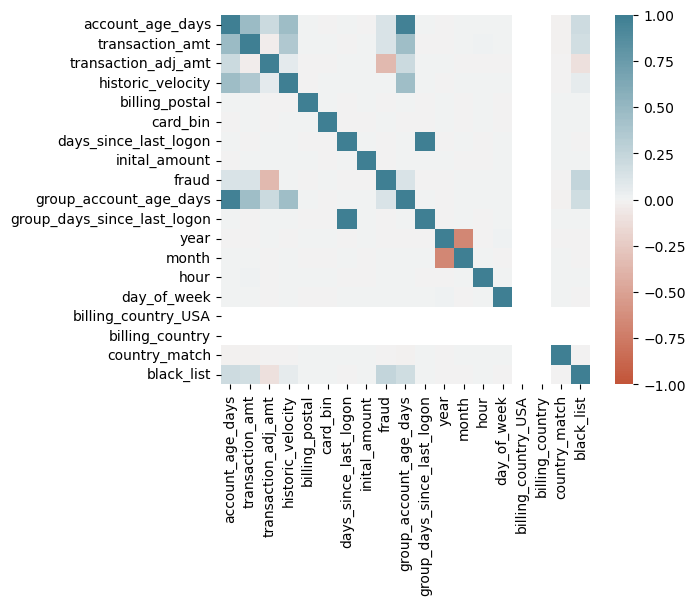

In [214]:
corr = data_tr.corr()

ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
)

We formed the group_days_since_last_logon and group_account_age_days characteristics based on the existing indicators of the number of days the account has existed and the last visit; as expected, they are highly correlated. Let's try to remove it for further work.

In [235]:
df_processed = df_encoder.drop(['group_days_since_last_logon', 'group_account_age_days'], axis=1) #data with indications of number of days

In [236]:
df_processed_1 = df_encoder.drop(['days_since_last_logon', 'account_age_days'], axis=1) #data with groups (new features based on the account’s lifespan and last logging)

#### Сonclusions

So, after conducting an intelligence analysis, it should be assumed that the most important information for identifying fraudulent transactions is stored in the location and IP addresses, and the signs account_age_days days_since_last_logon may also be useful. Attempts to find out any patterns from the timing of transactions (for example, to confirm the hypothesis that more fraud occurs at night) failed. Most likely, just like the development of the industry, the development of fraud in the industry is also taking place. It is necessary to pay attention to the fact that all cards are registered in the USA, but the location of transactions is distributed in many countries. So, we processed the data and added new features. Now let's see how machine learning algorithms cope with the task and identify patterns in the data.